In [10]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import re
from tensorflow.keras.preprocessing.text import Tokenizer
import plotly.graph_objects as go
import time

import sklearn

# import these modules
from nltk.stem import WordNetLemmatizer

In [11]:
import pandas as pd
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import string
from nltk.tokenize import word_tokenize

# Download required NLTK data
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('punkt_tab')



[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [12]:
df = pd.read_csv('/content/Twitter_Data.csv')

In [13]:
df.head()

,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [14]:
df['clean_text'].values

array(['when modi promised “minimum government maximum governance” expected him begin the difficult job reforming the state why does take years get justice state should and not business and should exit psus and temples',
       'talk all the nonsense and continue all the drama will vote for modi ',
       'what did just say vote for modi  welcome bjp told you rahul the main campaigner for modi think modi should just relax',
       ..., 'did you cover her interaction forum where she left ',
       'there big project came into india modi dream project but not happened reality',
       'have you ever listen about like gurukul where discipline are maintained even narendra modi rss only maintaining the culture indian more attack politics but someone attack hinduism rss will take action that proud for '],
      dtype=object)

In [15]:
df.isna().sum()

,0
clean_text,4
category,7


### Drop null values

In [16]:
df = df.dropna()
df.isna().sum()

,0
clean_text,0
category,0


In [17]:
df.duplicated().sum()
df.drop_duplicates(inplace=True)

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 162968 entries, 0 to 162979
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   clean_text  162968 non-null  object 
 1   category    162968 non-null  float64
dtypes: float64(1), object(1)
memory usage: 3.7+ MB


In [19]:
df['clean_text'] = df['clean_text'].astype(str)

# **Data Cleaning**

In [20]:
import string
lemmatizer = WordNetLemmatizer()
translator = str.maketrans('', '', string.punctuation)
stop_words = set(stopwords.words('english'))

In [21]:
# Convert text to lowercase
df['clean_text'] = df['clean_text'].apply(lambda x: x.lower())

# Remove punctuation using regex
df['clean_text'] = df['clean_text'].apply(lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', x))

# Tokenize the text
df['clean_text'] = df['clean_text'].apply(lambda x: nltk.word_tokenize(x))

# Lemmatize each word in the tokenized list & removing stopwords also
df['clean_text'] = df['clean_text'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x if word not in stop_words])

# Optionally, join tokens back into a string
df['clean_text'] = df['clean_text'].apply(lambda x: ' '.join(x))



In [22]:
df.clean_text.sample()

,clean_text
48514,chandul congress know naa samajh btw dont dige...


In [23]:
df.head()

,clean_text,category
0,modi promised minimum government maximum gover...,-1.0
1,talk nonsense continue drama vote modi,0.0
2,say vote modi welcome bjp told rahul main camp...,1.0
3,asking supporter prefix chowkidar name modi gr...,1.0
4,answer among powerful world leader today trump...,1.0


In [24]:
for i in df.iloc[0]:
    print(i)

modi promised minimum government maximum governance expected begin difficult job reforming state take year get justice state business exit psus temple
-1.0


In [25]:
df.category.value_counts(normalize=True)

,proportion
category,
1.0,0.443332
0.0,0.338778
-1.0,0.217889


In [26]:
dic = {
    "Neutral": 0.0,
    "Positive":1.0,
    "Negative":-1.0}
type(dic)

dict

In [27]:
df['category'] = df['category'].replace(0.0,'Neutral')
df['category'] = df['category'].replace(1,'Positive')
df['category'] = df['category'].replace(-1.0,'Negative')

In [28]:
df.category

,category
0,Negative
1,Neutral
2,Positive
3,Positive
4,Positive
...,...
162975,Negative
162976,Negative
162977,Neutral
162978,Neutral


In [29]:
from sklearn.model_selection import train_test_split

In [30]:
# Splitting the data: 80% training and 20% testing
train,test = train_test_split(df, test_size=0.2, random_state=42)

# Checking the shape of the splits
print("train shape:", train.shape)
print("test shape:", test.shape)


train shape: (130374, 2)
test shape: (32594, 2)


In [31]:
cat_temp = df.groupby('category').count().reset_index()
cat_temp

,category,clean_text
0,Negative,35509
1,Neutral,55210
2,Positive,72249


In [32]:
fig = px.bar(cat_temp, y='clean_text', x='category',color='category', text_auto='.2s',
            title="Category Distribution")
fig.show()

In [33]:
fig = px.pie(cat_temp, values='clean_text', names='category',title="Category Distribution")
fig.show()

In [34]:
temp = train.groupby('category').count().reset_index()

In [35]:
fig = go.Figure(go.Funnelarea(
    text =temp.category,
    values = temp.clean_text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

In [36]:
df['number_of_word_in_sent'] = df['clean_text'].apply(lambda x : len(str(x).split()))

In [37]:
fig = px.histogram(df, x="number_of_word_in_sent", color="category", marginal="rug",
                   hover_data=df.columns)
fig.update_layout(title_text='Distribution of Number Of words')
fig.show()

Text(0.5, 1.0, 'Distribution of Number Of words')

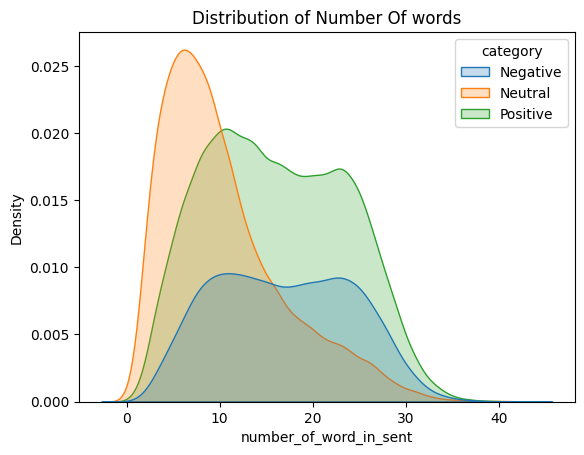

In [38]:
sns.kdeplot(df,x="number_of_word_in_sent",hue="category",fill=True)
plt.title("Distribution of Number Of words")


In [39]:
from collections import Counter

df['temp_list'] = df['clean_text'].apply(lambda x:str(x).split())
top = Counter([item for sublist in df['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Blues')

,Common_words,count
0,modi,155525
1,india,30983
2,bjp,14644
3,people,14414
4,like,12936
5,congress,12925
6,election,11690
7,narendra,11464
8,vote,10925
9,govt,10025


In [40]:
fig = px.bar(temp,x="count",y="Common_words",orientation="h",
             title='Commmon Words in Text',color='Common_words',
             width=700, height=700)
fig.show()

In [41]:
fig = px.treemap(temp,path=['Common_words'],values='count',title='Tree of Most Common Words')
fig.show()

In [42]:
Positive_sent = df[df['category']=='Positive']
Negative_sent = df[df['category']=='Negative']
Neutral_sent = df[df['category']=='Neutral']

In [43]:
#MosT common positive words
top = Counter([item for sublist in Positive_sent['temp_list'] for item in sublist])
temp_positive = pd.DataFrame(top.most_common(20))
temp_positive.columns = ['Common_words','count']
temp_positive.style.background_gradient(cmap='Greens')

,Common_words,count
0,modi,70465
1,india,17062
2,people,7212
3,bjp,7049
4,like,6241
5,election,5934
6,congress,5864
7,narendra,5533
8,vote,5208
9,one,5159


In [44]:
fig = px.treemap(temp_positive, path=['Common_words'], values='count',title='Tree Of Most Common Positive Words')
fig.show()

In [45]:
#MosT common negative words
top = Counter([item for sublist in Negative_sent['temp_list'] for item in sublist])
temp_negative = pd.DataFrame(top.most_common(20))
temp_negative = temp_negative.iloc[1:,:]
temp_negative.columns = ['Common_words','count']
temp_negative.style.background_gradient(cmap='Reds')

,Common_words,count
1,india,6726
2,people,4229
3,bjp,3619
4,like,3556
5,congress,3467
6,poor,2678
7,govt,2633
8,year,2477
9,election,2432
10,indian,2399


In [46]:
fig = px.treemap(temp_negative, path=['Common_words'], values='count',title='Tree Of Most Common Negative Words')
fig.show()

In [47]:
#MosT common Neutral words
top = Counter([item for sublist in Neutral_sent['temp_list'] for item in sublist])
temp_neutral = pd.DataFrame(top.most_common(20))
temp_neutral = temp_neutral.loc[1:,:]
temp_neutral.columns = ['Common_words','count']
temp_neutral.style.background_gradient(cmap='Reds')

,Common_words,count
1,india,7195
2,narendra,4016
3,bjp,3976
4,congress,3594
5,vote,3459
6,election,3324
7,like,3139
8,people,2973
9,say,2898
10,modis,2625


In [48]:
fig = px.treemap(temp_neutral, path=['Common_words'], values='count',title='Tree Of Most Common Neutral Words')
fig.show()

# Tokenization

In [49]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
import tensorflow as tf

In [50]:
max_words = 5000

tokenizer = Tokenizer(num_words=max_words,split=' ')

In [51]:
tokenizer.fit_on_texts(df['clean_text'].values)

In [52]:
total_words = len(tokenizer.index_word)
total_words

101659

In [53]:
token_text = []
for word in df.clean_text.str.split('\n'):
    token_text.append(tokenizer.texts_to_sequences(word)[0])

In [54]:

max_size = max([len(i) for i in token_text])


In [55]:
input_sentances = np.array(pad_sequences(token_text,maxlen=max_size,padding='post'))

In [56]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()

In [57]:
X = input_sentances
y = (df[['category']]).values

In [58]:
y = encoder.fit_transform(y).toarray()

## Encoding -

**Positive -  [0,0,1]**

**Neutral - [0,1,0]**

**Negative - [1,0,0]**

In [59]:
y

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       ...,
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

AttributeError: 'numpy.ndarray' object has no attribute 'value_counts'

In [60]:
df.category.unique()

array(['Negative', 'Neutral', 'Positive'], dtype=object)

In [61]:
# Splitting data into train test split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.33, random_state=42)

In [62]:
print(X_train.shape,y_train.shape)
print(X_test.shape,y_test.shape)

(109188, 39) (109188, 3)
(53780, 39) (53780, 3)


In [63]:
y_train.shape

(109188, 3)

In [64]:
max_sequence_len = max([len(i) for i in token_text])


# Model Training (LSTM)

In [65]:
from tensorflow.keras import Sequential
from keras.layers import LSTM, Embedding, Dense,Dropout
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D

In [66]:
# Define early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [67]:
embed_dim = 128
lstm_out = 196

model = Sequential()
model.add(Embedding(max_words, embed_dim,input_length = X.shape[1]))
model.add(SpatialDropout1D(0.4))
model.add(LSTM(lstm_out, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(3,activation='softmax'))
model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
print(model.summary())


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning:

Argument `input_length` is deprecated. Just remove it.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ spatial_dropout1d (SpatialDropout1D) │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
batch_size = 32
model.fit(X_train, y_train, epochs = 7, batch_size=batch_size, verbose = 2)

Epoch 1/7
3413/3413 - 354s - 104ms/step - accuracy: 0.7870 - loss: 0.5631
Epoch 2/7
3413/3413 - 379s - 111ms/step - accuracy: 0.8796 - loss: 0.3750
Epoch 3/7


In [73]:
# Evaluate the model on the test set
accuracy = model.evaluate(X_test, y_test)[1]
print(f'Test Accuracy: {accuracy * 100:.2f}%')

1681/1681 ━━━━━━━━━━━━━━━━━━━━ 96s 57ms/step - accuracy: 0.8970 - loss: 0.3430
Test Accuracy: 89.51%


In [70]:
# saving model
model.save('sentiment_model.h5')

In [71]:
import pickle

with open('tokenizer.pickle','wb') as handle:
  pickle.dump(tokenizer,handle,protocol=pickle.HIGHEST_PROTOCOL)



In [131]:
def predict_sentiment(text):
  input_text = [text]
  tokenized_text = tokenizer.texts_to_sequences(input_text)
  input_sentances = np.array(pad_sequences(tokenized_text,maxlen = max_sequence_len,padding='post'))
  print(input_sentances)
  sentiment = model.predict(input_sentances,batch_size=1,verbose = 3)[0]
  print(sentiment)

  if(np.argmax(sentiment) == 0):
      print("Negative")
  elif (np.argmax(sentiment) == 1):
      print("Neutral")
  elif (np.argmax(sentiment) == 2):
      print("Positive")



In [132]:
predict_sentiment("modi promised minimum government maximum governance expected begin difficult job reforming state take year get justice state business exit psus temple")

[[   1  243  639   27 1538  717 1006 1233 1083   50  105   42   14   25
   959  105  402 3606 4939 1091    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0]]
[0.93481195 0.02154329 0.04364478]
Negative


In [128]:
text = ['modi promised minimum government maximum governance expected begin difficult job reforming state take year get justice state business exit psus temple']
tokenized_text = tokenizer.texts_to_sequences(text)
input_sentances = np.array(pad_sequences(tokenized_text,maxlen = max_sequence_len,padding='post'))
print(input_sentances)
sentiment = model.predict(input_sentances,batch_size=1,verbose = 3)[0]
print(sentiment)

if(np.argmax(sentiment) == 0):
    print("Negative")
elif (np.argmax(sentiment) == 1):
    print("Neutral")
elif (np.argmax(sentiment) == 2):
    print("Positive")


[[   1  243  639   27 1538  717 1006 1233 1083   50  105   42   14   25
   959  105  402 3606 4939 1091    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0]]
[0.93481195 0.02154329 0.04364478]
Negative


In [126]:
a = [1,0,0]
b = [0,1,0]
c = [0,0,1]

In [127]:
print(np.argmax(a))
print(np.argmax(b))
print(np.argmax(c))

0
1
2
